In [1]:
# !pip install keras
# !pip install keras-rl2

In [2]:
from os import path, chdir, getcwd, mkdir
projectDirectory = "C://Users//e0425530//Project-Materials//gym-duckietown//learning"
chdir(projectDirectory)
getcwd()

'C:\\Users\\e0425530\\Project-Materials\\gym-duckietown\\learning'

In [3]:
import ast
import argparse
import logging

import os
import numpy as np
from gym import wrappers


# Duckietown Specific
from reinforcement.pytorch.ddpg import DDPG
from reinforcement.pytorch.utils import seed, evaluate_policy, ReplayBuffer
from utilss.env import launch_env
from utilss.wrappers import NormalizeWrapper, ImgWrapper, \
    DtRewardWrapper, ActionWrapper, ResizeWrapper

logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)

In [4]:
env = launch_env()
print("Initialized environment")

# Wrappers
env = ResizeWrapper(env)
env = NormalizeWrapper(env)
env = ImgWrapper(env) # to make the images from 160x120x3 into 3x160x120
env = ActionWrapper(env)
env = DtRewardWrapper(env)

c:\Users\e0425530\AppData\Local\anaconda3\envs\duckietown\lib\site-packages\pyglet\image\codecs\wic.py:289: UserWarning: [WinError -2147417850] Cannot change thread mode after it is set
  warnings.warn(str(err))


Initialized environment


In [5]:
state_dim = env.observation_space.shape
action_dim = env.action_space.shape[0]
max_action = float(env.action_space.high[0])
print(state_dim, action_dim, max_action)
print(env.action_space.high[0], env.action_space.high[1])
print(env.action_space.low[0], env.action_space.low[1])

(3, 120, 160) 2 1.0
1.0 1.0
-1.0 -1.0


In [6]:
parser = argparse.ArgumentParser()

# DDPG Args
parser.add_argument("--seed", default=0, type=int)  # Sets Gym, PyTorch and Numpy seeds
parser.add_argument("--start_timesteps", default=1e3, type=int)  # How many time steps purely random policy is run for
parser.add_argument("--eval_freq", default=5e3, type=float)  # How often (time steps) we evaluate
parser.add_argument("--max_timesteps", default=1e5, type=float)  # Max time steps to run environment for
parser.add_argument("--save_models", action="store_true", default=True)  # Whether or not models are saved
parser.add_argument("--expl_noise", default=0.1, type=float)  # Std of Gaussian exploration noise
parser.add_argument("--batch_size", default=32, type=int)  # Batch size for both actor and critic
parser.add_argument("--discount", default=0.99, type=float)  # Discount factor
parser.add_argument("--tau", default=0.005, type=float)  # Target network update rate
parser.add_argument("--policy_noise", default=0.2, type=float)  # Noise added to target policy during critic update
parser.add_argument("--noise_clip", default=0.5, type=float)  # Range to clip target policy noise
parser.add_argument("--policy_freq", default=2, type=int)  # Frequency of delayed policy updates
parser.add_argument("--env_timesteps", default=500, type=int)  # Frequency of delayed policy updates
parser.add_argument("--replay_buffer_max_size", default=10000, type=int)  # Maximum number of steps to keep in the replay buffer
parser.add_argument('--model-dir', type=str, default='reinforcement/pytorch/models/')
parser.add_argument('--control_path', type=str, default='C://Users//e0425530//Project-Materials//testcases//milestone1_paths//map1_0_seed1_start_0,1_goal_15,1.txt')
parser.add_argument('--load_pretrained', action="store_true", default=True)


_StoreTrueAction(option_strings=['--load_pretrained'], dest='load_pretrained', nargs=0, const=True, default=True, type=None, choices=None, help=None, metavar=None)

In [7]:
from reinforcement.pytorch.train_reinforcement import _train
opt, unknown = parser.parse_known_args()
_train(opt)

Given control_path is  9001
[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1)]
Starting DDPG init
Initialized Actor
Initialized Target+Opt [Actor]
Initialized Critic
Initialized Target+Opt [Critic]
Successully loaded the model from reinforcement/pytorch/models/
Initialized DDPG
before policy evaluations
after policy evaluations
Starting training
timestep: 0 | reward: 0
Current position is (0, 1)
Additional reward of 0.0
timestep: 1 | reward: 10.014459697121062
Current position is (0, 1)
Additional reward of 0.0
timestep: 2 | reward: -10.0
Total T: 2 Episode Num: 1 Episode T: 2 Reward: 0.014460
Current position is (0, 1)
Additional reward of 0.0
timestep: 3 | reward: 0.11160181939718772
Current position is (0, 1)
Additional reward of 0.0
timestep: 4 | reward: 0.3754514358254557
Current position is (0, 1)
Additional reward of 0.0
timestep: 5 | reward: 0.2098213470478596
Current position is (0, 1)
Addition

In [8]:
import math
def decreasing_function(x, n):
    if x == 0:
        return 0
    else:
        x_normalized = (2 * x / n) - 1
        return math.atanh(x_normalized) / math.atanh(1 - 1/n)

decreasing_function(5, 15)
decreasing_function(10, 15)
decreasing_function(15, 15)

ValueError: math domain error

In [ ]:
# from os import path, chdir, getcwd, mkdir
# projectDirectory = "C://Users//e0425530//Project-Materials//gym-duckietown//learning"
# chdir(projectDirectory)
# getcwd()

# from reinforcement.pytorch.enjoy_reinforcement import _enjoy
# _enjoy()

Initialized environment
Initialized Wrappers
Starting DDPG init
Initialized Actor
Initialized Target+Opt [Actor]
Initialized Critic
Initialized Target+Opt [Critic]


KeyboardInterrupt: 

In [ ]:
import torch
gpu_name = torch.cuda.get_device_name(0)
print("Using GPU", gpu_name)

Using GPU GeForce RTX 3090


In [ ]:
from os import path, chdir, getcwd, mkdir
projectDirectory = "C://Users//e0425530//Project-Materials"
chdir(projectDirectory)
getcwd()

path = "C://Users//e0425530//Project-Materials//testcases//milestone1_paths//map1_0_seed1_start_0,1_goal_15,1.txt"
def extract_path(path):
    path = []
    with open(control_path, 'r') as file:
        for line in file:
            line = line.strip()
            values = line.split(',')
            path.append((int(values[0][1:]), int(values[1].strip()[0])))
    print(path)    
    return path

def prepare_intention_allignment_reward(path):
    intention_reward_table = {}
    for i in range(len(path)):
        cell = path[i]
        intention_reward_table[cell] = i
    return intention_reward_table

def get_intention_allignment_reward(intention_reward_table, cur_pos):
    print(f'Current position is {cur_pos}')
    if cur_pos in intention_reward_table:
        print(f'Additional reward of {intention_reward_table[cur_pos]}')
        return intention_reward_table[cur_pos]
    else:
        return -1

path = extract_path()
table = prepare_intention_allignment_reward(path)
table[path[14]]

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1)]


14

In [14]:
from os import path, chdir, getcwd, mkdir
projectDirectory = "C://Users//e0425530//Project-Materials//gym-duckietown//learning"
chdir(projectDirectory)

from reinforcement.pytorch.ddpg import DDPG
from reinforcement.pytorch.utils import seed, evaluate_policy, ReplayBuffer
from utilss.env import launch_env
from utilss.wrappers import NormalizeWrapper, ImgWrapper, \
    DtRewardWrapper, ActionWrapper, ResizeWrapper

env = launch_env()
obs = env.reset()


In [8]:
pixel = obs[0,0,:]
pixel.shape
pixel[2]
obs.shape

(480, 640, 3)

In [17]:
# [146 137  67]

def check_yellow_color(pixel):
    if pixel[0] < 120 or pixel[0] > 220:
        return False
    if pixel[1] < 130 or pixel[1] > 220:
        return False
    if pixel[2] < 50 or pixel[2] > 90:
        return False
    return True

      

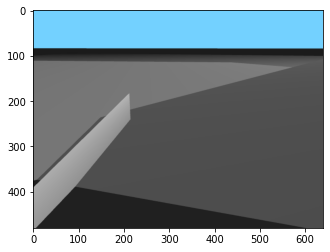

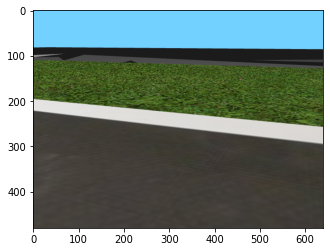

[71 66 61]


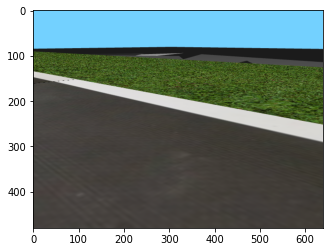

[68 64 62]


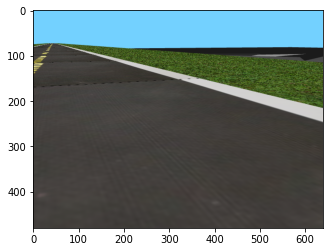

[66 63 60]


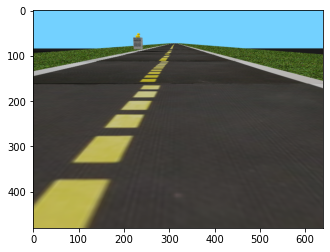

[192 181  79]


In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Display the image using matplotlib
plt.imshow(obs, cmap='gray')
plt.show()

actions = [(0, 1)] * 100
i =0
for action in actions:
    new_obs, reward, done, info = env.step(action)
    plt.imshow(new_obs, cmap='gray')
    plt.show()
    left_bottom_pixel = new_obs[-1,0,:]
    print(left_bottom_pixel)
    if check_yellow_color(left_bottom_pixel):
        break
